In [10]:
import cv2
import yaml
import datetime
import os
import torch
import warnings
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import glob
from aiogram import Bot, Dispatcher, executor, types
import smtplib
from os.path import basename
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
from email.mime.image import MIMEImage
import nest_asyncio
nest_asyncio.apply()


### считываем данные из файла настроек

In [11]:
env = yaml.safe_load(open('bot.yml')) 
warnings.filterwarnings("ignore")

### загружаем предобученную модель

In [12]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True, device='cpu', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/archive/master.zip" to C:\Users\a.starik/.cache\torch\hub\master.zip
YOLOv5  2021-12-2 torch 1.10.0+cpu CPU



100%|██████████| 14.0M/14.0M [00:12<00:00, 1.18MB/s]
Fusing layers... 


Model Summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


### создадим функцию для отправки сообщений (для примера на mailtrap.io)

In [13]:
def send_email(receiver, img):
    sender = 'bot@sas.home'

    msg = MIMEMultipart()

    msg['Subject'] = '[WARN]threshold level'
    msg['From'] = sender
    msg['To'] = receiver

    msgText = MIMEText('<b>%s</b>' % ('<h2>Добрый день</h2><br><b>Превышен пороговый уровень!</b><br><img src="cid:photo"><br>'), 'html')
    msg.attach(msgText)
    msgImage = MIMEImage(img)
    msgImage.add_header('Content-ID', '<photo>')
    msg.attach(msgImage)

    with smtplib.SMTP("smtp.mailtrap.io", 2525) as server:
        server.login(env['email_user'], env['email_pw'])
        server.sendmail(sender, receiver, msg.as_string())


### Создаем функцию проверки порогового значения людей на картинке, на вход передаем картинку и пороговое значение, на выходе получаем либо картинку в виде массива numpy, если порог равен или превышен, в ином случае ничего не получаем

In [14]:
def check_threshold_level(img, threshold_level):
    threshold_level = threshold_level -1
    marker = False
    results = model(img)
    # модель возвращает нам все распознанные объекты, из которых нам нужны только люди, поэтому отфильтруем результат
    df = results.pandas().xyxy[0]
    persons = df[df['class'] == 0]
    # удалим лишние столбцы
    persons = persons.drop(['name', 'class', 'confidence'], axis=1)
    if len(persons) == 0:
        # на фото нет людей
        return
    # переведем в int все значения координат
    persons = persons.astype('int32')
    # 0 не может быть координатой, заменим на 1
    for column in persons.columns.tolist():  
        persons.loc[persons[column] == 0, column] = 1
    i = 0
    # конвертируем данные в массив numpy для последующей построчной обработки
    points_array = persons.to_numpy()
    for row in points_array:
        # получаем координаты человека и выберем цвет: зеленый, если нет превышения, желтый, 
        # если на фото количество людей равно порогу и красный, если количество превышает пороговое значение
        xmin, ymin, xmax, ymax = row
        if i == threshold_level:
            color = (0, 223, 255)
            marker = True
        elif i > threshold_level:
            marker = True
            color = (0, 0, 255)
        else:
            color = (0, 255, 0)
        # рисуем границы
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax),
                          color, thickness=2)
        # и подписываем                           
        cv2.putText(img, str(i+1),
                        (xmin+5, ymin - 5),
                        cv2.FONT_HERSHEY_DUPLEX,
                        fontScale=1,
                        thickness=2,
                        color=(80, 127, 255))
        i += 1
    if marker:
        return img


### проверим работу на кошках 😃

На фото людей не найдено


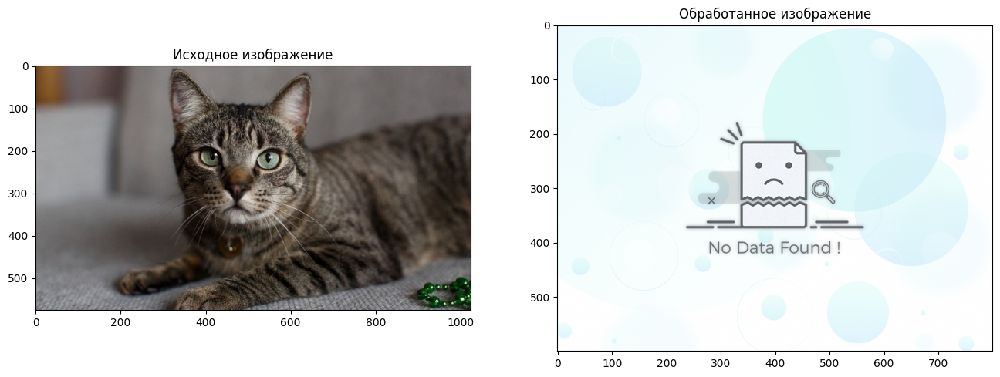

In [15]:
plt.figure(figsize=(16,13), dpi=100)
plt.subplot2grid((2,2),(0,0))

img = cv2.imread('cat.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

img = check_threshold_level(img, 2)
if img is None:
    print('На фото людей не найдено')
    img2 = cv2.cvtColor(cv2.imread('nodata.png'), cv2.COLOR_BGR2RGB)
else:
    img2 = img
plt.title('Исходное изображение')
plt.subplot2grid((2,2),(0,1))
plt.imshow(img2)
plt.title('Обработанное изображение')
plt.show()

### и то же самое на фото из одного торгового центра

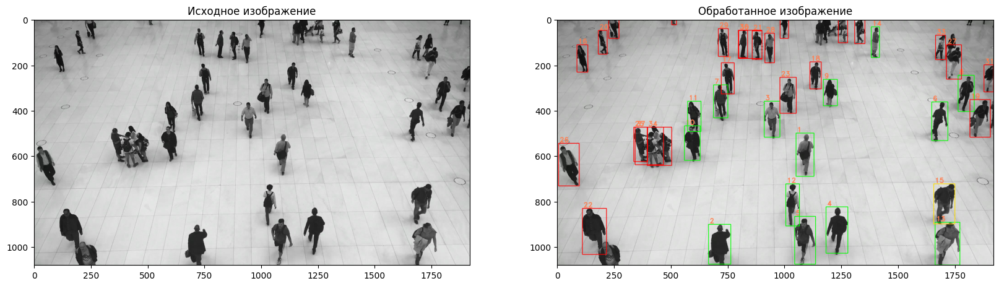

In [16]:
plt.figure(figsize=(20,20), dpi=100)
plt.subplot2grid((2,2),(0,0))

img = cv2.imread('People.jpg')
plt.imshow(img)

img = check_threshold_level(img, 15)
if img is None:
    print('На фото людей не найдено')
    img2 = cv2.cvtColor(cv2.imread('nodata.png'), cv2.COLOR_BGR2RGB)
else:
    img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.title('Исходное изображение')
plt.subplot2grid((2,2),(0,1))
plt.imshow(img2)
plt.title('Обработанное изображение')
plt.show()

### Определим теперь функцию, которая принимает на вход видеопоток, пороговое значение, задержку в секундах и запускает распознавание. Задержка нужна, если не требуется распознавание данных в реальном времени

In [19]:
def demo_safe_th_frame(videopath, th_level, delay):
    if not os.path.exists('th_frames'):
        os.makedirs('th_frames')
    cap = cv2.VideoCapture(videopath)
    while True:
        filepath_frame = os.path.join(
            'th_frames', f'frame_{datetime.datetime.today().strftime("%H-%M-%S")}.png')
        ret, frame = cap.read()
        fps = cap.get(cv2.CAP_PROP_FPS)
        multiply = int(round(fps * delay))
        if ret:
            frame_id = int(round(cap.get(1)))
            if frame_id % multiply == 0:
                img = check_threshold_level(frame, th_level)
                if img is not None:
                    cv2.imwrite(filepath_frame, img)
                    email_img = open(filepath_frame, 'rb').read()
                    send_email('operator@sas.work', email_img)

        else:
            break
    cap.release()   


### запустим нашу функцию, в качестве входных параметров используется видеофайл, порог равен 4 и задержка 10 секунд

In [20]:

demo_safe_th_frame(env['demo_video'], 4 ,10)

### и выведем результаты 

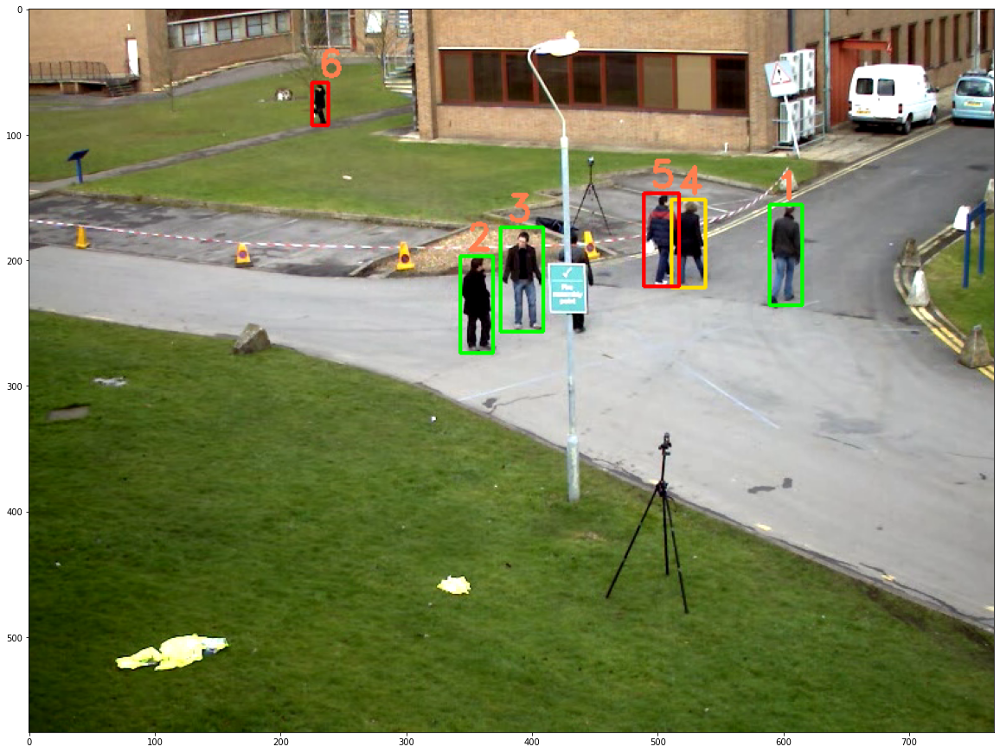

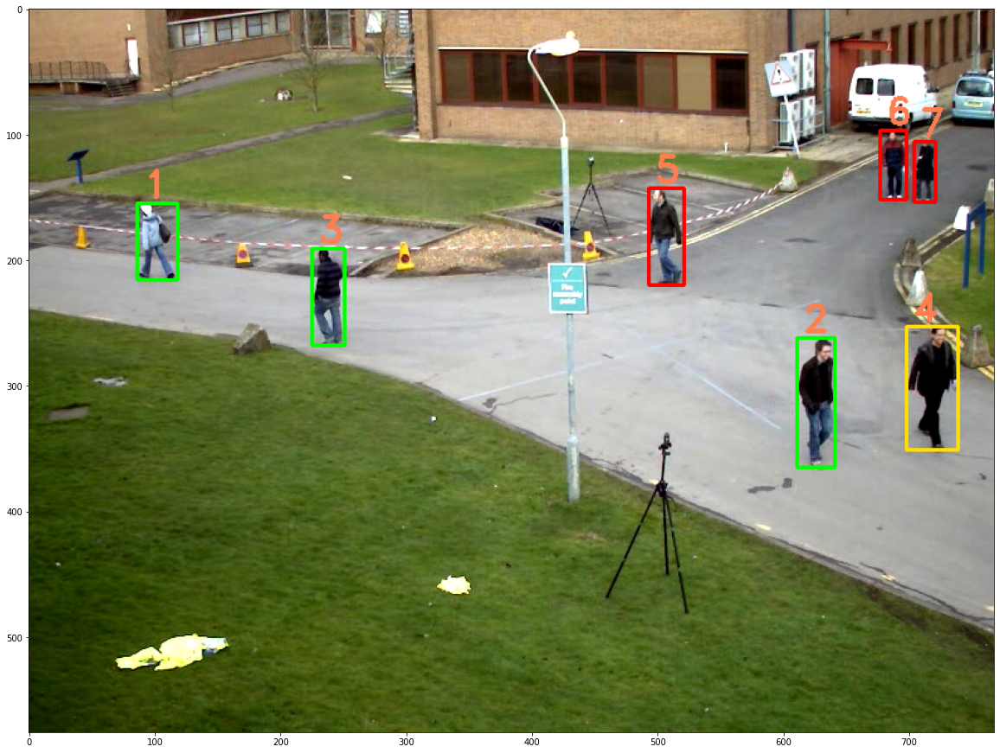

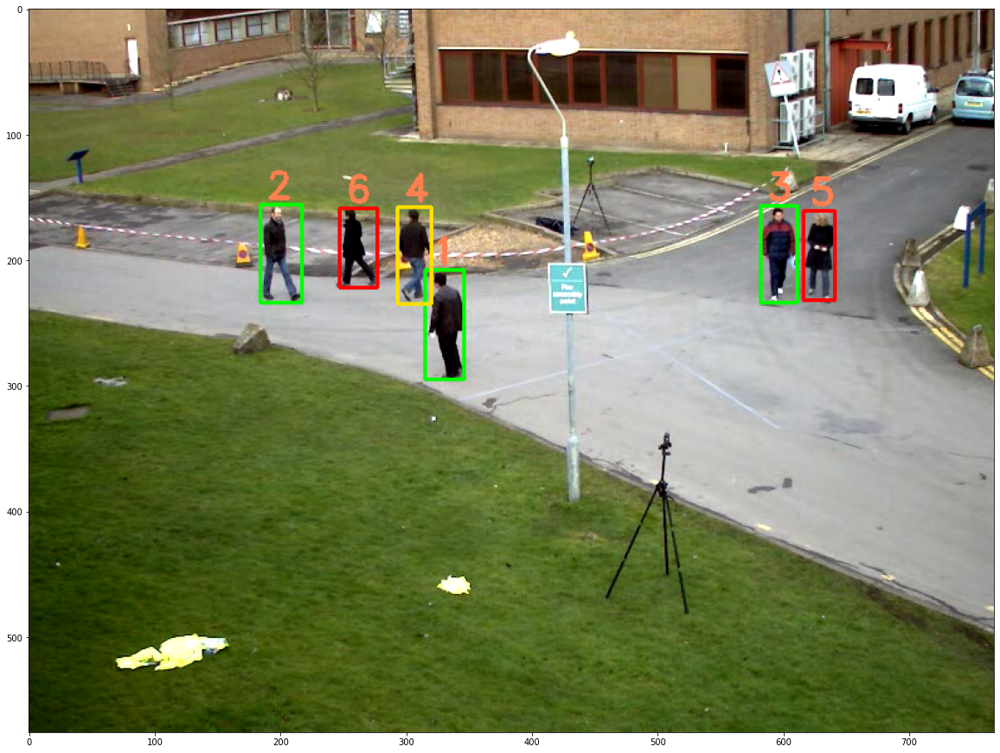

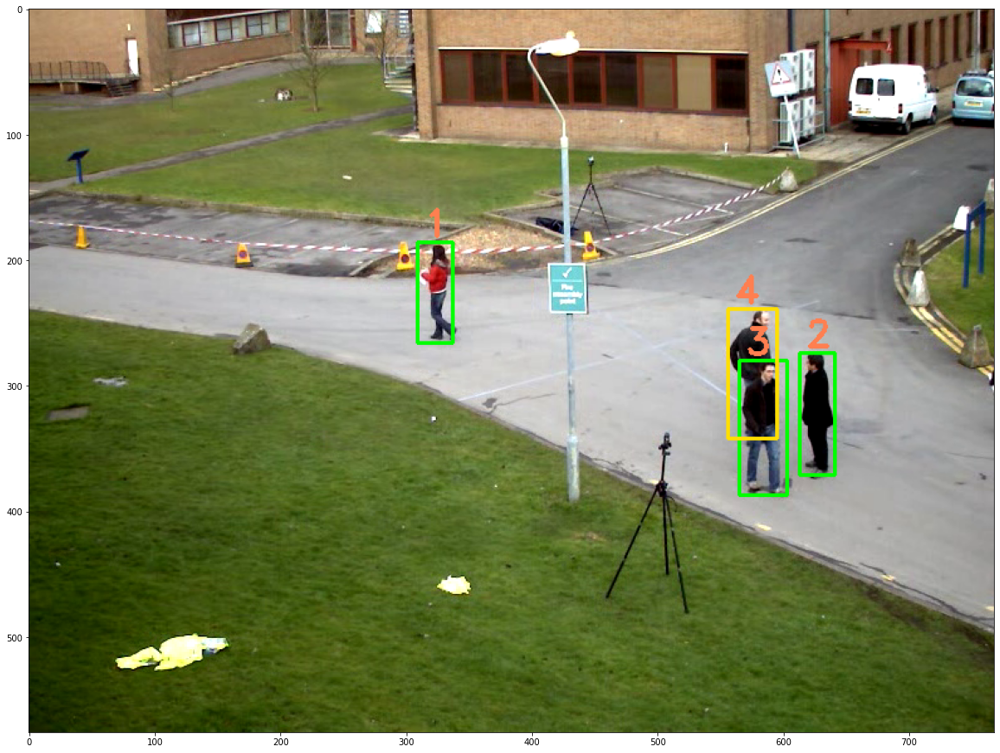

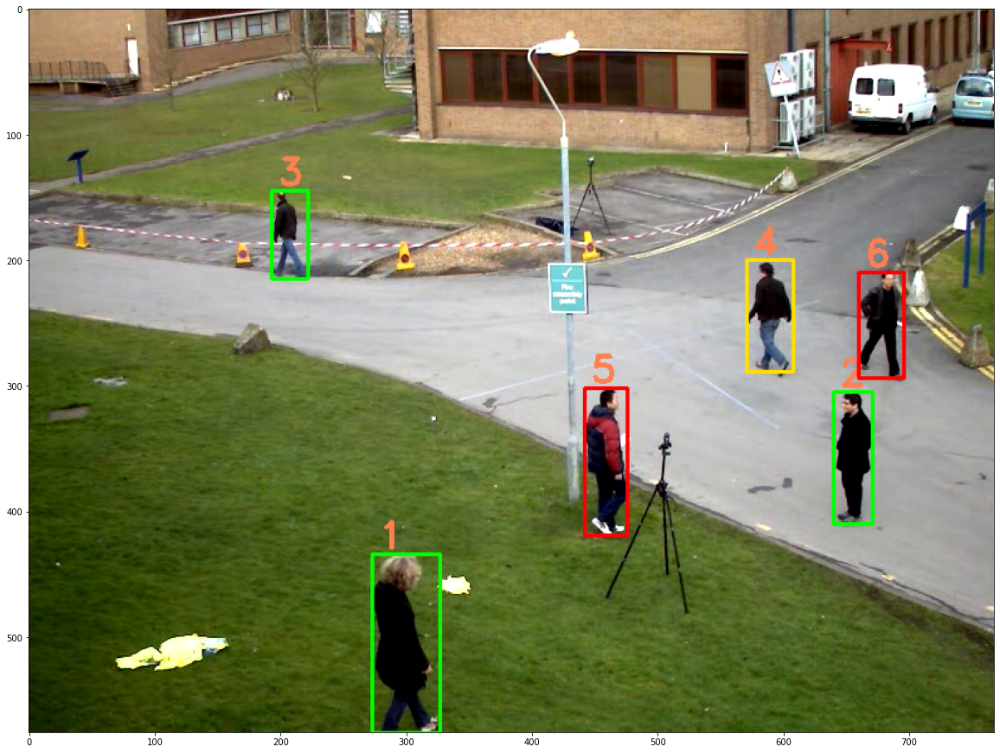

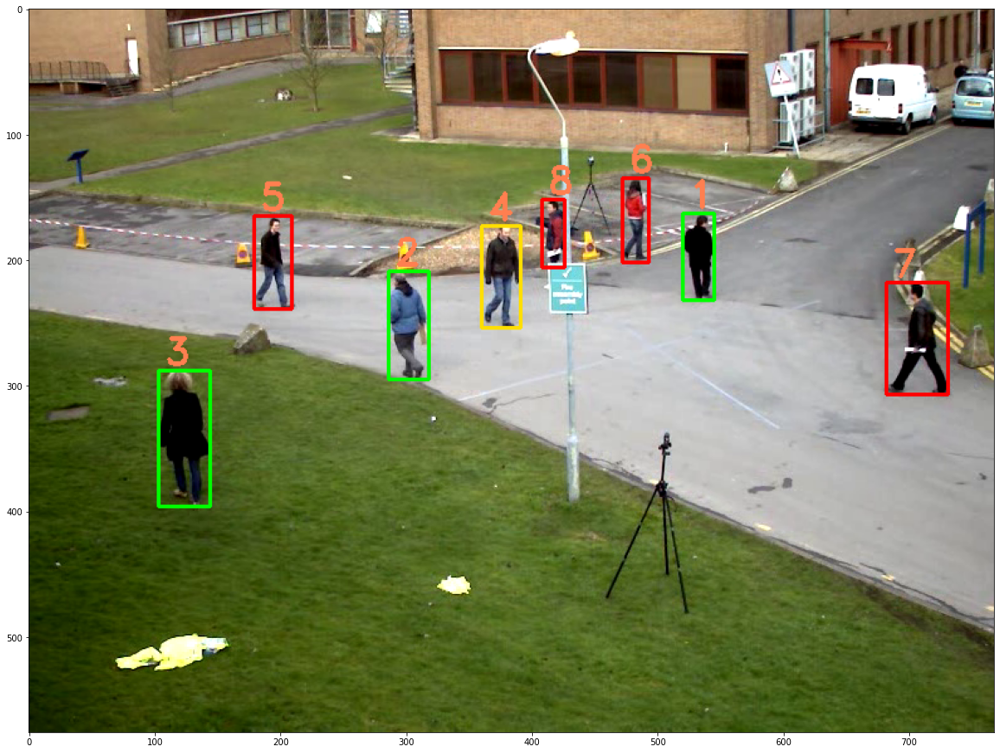

In [22]:
img_arr = glob.glob('th_frames/*')

for img_file in img_arr:
    plt.figure(figsize=(20,20))
    img = Image.open(img_file).convert('RGB')
    plt.imshow(img)
    plt.show()

### Создадим бота в телеграме для получения уведомлений о превышении пороговых значений

In [23]:
bot = Bot(token=env['bot_api'])
dp = Dispatcher(bot)

In [24]:
@dp.message_handler(commands='demo')
async def cmd_test1(message: types.Message):
    await message.answer('Проверка начата')
    cap = cv2.VideoCapture(env['demo_video'])
    while True:
        ret, frame = cap.read()
        fps = cap.get(cv2.CAP_PROP_FPS)
        multiply = int(round(fps * 10))
        if ret:
            frame_id = int(round(cap.get(1)))
            if frame_id % multiply == 0:
                img = check_threshold_level(frame, 4)
                if img is not None:
                    cv2.imwrite('tmp.png', img)
                    photo = types.InputFile('tmp.png')
                    caption_text = f"⚠️Превышение порога!"
                    await bot.send_photo(chat_id=message.chat.id, photo=photo, 
                            caption=caption_text)
                    os.remove('tmp.png')
        else:
            break
    cap.release() 


In [ ]:
executor.start_polling(dp, skip_updates=True)